In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import numpy as np

In [4]:
df=pd.read_csv("train.csv")

In [5]:
test_df=pd.read_csv("test.csv")

## Using pandas profile report to know about data:

In [6]:
report=pp.ProfileReport(df,title = "Pandas Profile Report")
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
df.describe()

,id,log_price,accommodates,bathrooms,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds
count,7.411100e+04,74111.000000,74111.000000,73911.000000,74111.000000,74111.000000,74111.000000,57389.000000,74020.000000,73980.000000
mean,1.126662e+07,4.782069,3.155146,1.235263,38.445958,-92.397525,20.900568,94.067365,1.265793,1.710868
std,6.081735e+06,0.717394,2.153589,0.582044,3.080167,21.705322,37.828641,7.836556,0.852143,1.254142
min,3.440000e+02,0.000000,1.000000,0.000000,33.338905,-122.511500,0.000000,20.000000,0.000000,0.000000
25%,6.261964e+06,4.317488,2.000000,1.000000,34.127908,-118.342374,1.000000,92.000000,1.000000,1.000000
50%,1.225415e+07,4.709530,2.000000,1.000000,40.662138,-76.996965,6.000000,96.000000,1.000000,1.000000
75%,1.640226e+07,5.220356,4.000000,1.000000,40.746096,-73.954660,23.000000,100.000000,1.000000,2.000000
max,2.123090e+07,7.600402,16.000000,8.000000,42.390437,-70.985047,605.000000,100.000000,10.000000,18.000000


Observations:
1. Log prices of airbnbs have mean of 4.7 with standard deviation of 0.717.
2. bedroom of airbnbs have mean of 1.2 with standard deviation of 0.85.
3. Mean number revies that a airbnb gets is 20.9 with standard deviation of 37.8.
4. No of ratings that a airbnb gets is 94 with standard deviation of 7.8.

In [8]:
##check missing values
df.isnull().sum()

id                            0
log_price                     0
property_type                 0
room_type                     0
amenities                     0
accommodates                  0
bathrooms                   200
bed_type                      0
cancellation_policy           0
cleaning_fee                  0
city                          0
description                   0
first_review              15864
host_has_profile_pic        188
host_identity_verified      188
host_response_rate        18299
host_since                  188
instant_bookable              0
last_review               15827
latitude                      0
longitude                     0
name                          0
neighbourhood              6872
number_of_reviews             0
review_scores_rating      16722
thumbnail_url              8216
zipcode                     966
bedrooms                     91
beds                        131
dtype: int64

There are lots of missing values in the dataset.

In [9]:
missing_df = df.isnull().sum(axis=0).reset_index()
missing_df.columns = ['column_name', 'missing_count']
missing_df = missing_df.loc[missing_df['missing_count']>0]
missing_df = missing_df.sort_values(by='missing_count')
missing_df

,column_name,missing_count
27,bedrooms,91
28,beds,131
13,host_has_profile_pic,188
14,host_identity_verified,188
16,host_since,188
6,bathrooms,200
26,zipcode,966
22,neighbourhood,6872
25,thumbnail_url,8216
18,last_review,15827


In [10]:
train_df = df

In [27]:
# 'bathrooms'
train_df['bathrooms'] = df['bathrooms'].fillna(0)
test_df['bathrooms'] = test_df['bathrooms'].fillna(0)

# 'bedrooms'
train_df['bedrooms'] = train_df['bedrooms'].fillna(0)
test_df['bedrooms'] = test_df['bedrooms'].fillna(0)

# 'beds' 
train_df['beds'] = train_df['beds'].fillna(0)
test_df['beds'] = test_df['beds'].fillna(0)

# 'host_has_profile_pic'
train_df.loc[train_df.host_has_profile_pic == 't', 'host_has_profile_pic'] = 1
train_df.loc[train_df.host_has_profile_pic == 'f', 'host_has_profile_pic'] = 0
train_df['host_has_profile_pic'] = train_df['host_has_profile_pic'].fillna(0)
test_df.loc[test_df.host_has_profile_pic == 't', 'host_has_profile_pic'] = 1
test_df.loc[test_df.host_has_profile_pic == 'f', 'host_has_profile_pic'] = 0
test_df['host_has_profile_pic'] = test_df['host_has_profile_pic'].fillna(0)

# 'neighbourhood'
train_df['neighbourhood'] = train_df['neighbourhood'].fillna('Unknown')
test_df['neighbourhood'] = test_df['neighbourhood'].fillna('Unknown')

# 'review_scores_rating'
train_df['review_scores_rating'] = train_df['review_scores_rating'].fillna(0)
test_df['review_scores_rating'] = test_df['review_scores_rating'].fillna(0)

# 'host_response_rate'
train_df['host_response_rate'] = train_df['host_response_rate'].astype(str).str.replace('%','')
train_df['host_response_rate'] = train_df['host_response_rate'].astype(str).str.replace('nan','0')
train_df['host_response_rate'] = train_df['host_response_rate'].fillna('0')
train_df['host_response_rate'] = train_df['host_response_rate'].str.replace(',', '').astype(float)
train_df['host_response_rate'] = pd.to_numeric(train_df['host_response_rate'])

test_df['host_response_rate'] = test_df['host_response_rate'].astype(str).str.replace('%','')
test_df['host_response_rate'] = train_df['host_response_rate'].astype(str).str.replace('nan','0')
test_df['host_response_rate'] = test_df['host_response_rate'].fillna('0')
test_df['host_response_rate'] = test_df['host_response_rate'].str.replace(',', '').astype(float)
test_df['host_response_rate'] = pd.to_numeric(test_df['host_response_rate'])
                                                                                                                                    
# 'thumbnai_url'
train_df['thumbnail_url'] = train_df['thumbnail_url'].fillna('Unknown')
test_df['thumbnail_url'] = test_df['thumbnail_url'].fillna('Unknown')

# 'last_review'
train_df['last_review'] = train_df['last_review'].fillna('00-00-00')
test_df['last_review'] = test_df['last_review'].fillna('00-00-00')

# 'first_review'
train_df['first_review'] = train_df['first_review'].fillna('00-00-00')
test_df['first_review'] = test_df['first_review'].fillna('00-00-00')

# 'host_since'
train_df['host_since'] = train_df['host_since'].fillna('00-00-00')
test_df['host_since'] = test_df['host_since'].fillna('00-00-00')

# 'host_identity_verified'
train_df.loc[train_df.host_identity_verified == 't', 'host_identity_verified'] = 1
train_df.loc[train_df.host_identity_verified == 'f', 'host_identity_verified'] = 0
train_df['host_identity_verified'] = train_df['host_identity_verified'].fillna(0)
test_df.loc[test_df.host_identity_verified == 't', 'host_identity_verified'] = 1
test_df.loc[test_df.host_identity_verified == 'f', 'host_identity_verified'] = 0
test_df['host_identity_verified'] = test_df['host_identity_verified'].fillna(0)

# 'zipcode', ***this might take some time, but works perfect***
train_df['zipcode'] = train_df['zipcode'].fillna(0)   
test_df['zipcode'] = test_df['zipcode'].fillna(0)


In [28]:
missing_df = train_df.isnull().sum(axis=0).reset_index()
missing_df.columns = ['column_name', 'missing_count']
missing_df = missing_df.loc[missing_df['missing_count']>0]
missing_df = missing_df.sort_values(by='missing_count')
missing_df

,column_name,missing_count


In [29]:
train_df['int_price'] = np.exp(train_df['log_price'])

In [30]:
train_df.pivot_table(values='int_price',index='property_type',columns='city')

city,Boston,Chicago,DC,LA,NYC,SF
property_type,,,,,,
Apartment,167.716744,122.763368,199.836840,124.099510,139.850646,215.796375
Bed & Breakfast,105.705882,111.000000,143.823529,97.254310,134.021053,150.196078
Boat,358.800000,367.666667,82.666667,181.103448,146.000000,404.000000
Boutique hotel,149.000000,215.500000,142.375000,104.000000,347.812500,202.142857
Bungalow,NaN,99.333333,172.500000,133.029326,144.166667,227.000000
Cabin,NaN,NaN,110.000000,111.180328,176.666667,154.714286
Camper/RV,NaN,NaN,NaN,129.321429,NaN,160.400000
Casa particular,NaN,NaN,NaN,80.000000,NaN,NaN
Castle,NaN,NaN,199.000000,283.750000,175.000000,228.333333


In [31]:
train_df.to_csv('new_train.csv', encoding='utf-8', index=False)
test_df.to_csv('new_test.csv', encoding='utf-8', index=False)

In [32]:
Rtrain_df = pd.read_csv('new_train.csv')
Rtest_df = pd.read_csv('new_test.csv')

In [33]:
Rtrain_df.drop(['int_price'], axis =1, inplace=True)

Rtrain_df.drop(['id'], axis =1, inplace=True)
Rtest_df.drop(['id'], axis =1, inplace=True)

Rtrain_df.drop(['log_price'], axis =1, inplace=True)

Rtrain_df.drop(['neighbourhood'], axis =1, inplace=True)
Rtest_df.drop(['neighbourhood'], axis =1, inplace=True)

Rtrain_df.drop(['description'], axis =1, inplace=True)
Rtest_df.drop(['description'], axis =1, inplace=True)

Rtrain_df.drop(['first_review'], axis =1, inplace=True)
Rtest_df.drop(['first_review'], axis =1, inplace=True)

Rtrain_df.drop(['last_review'], axis =1, inplace=True)
Rtest_df.drop(['last_review'], axis =1, inplace=True)

Rtrain_df.drop(['host_since'], axis =1, inplace=True)
Rtest_df.drop(['host_since'], axis =1, inplace=True)

Rtrain_df.drop(['thumbnail_url'], axis =1, inplace=True)
Rtest_df.drop(['thumbnail_url'], axis =1, inplace=True)

Rtrain_df.drop(['zipcode'], axis =1, inplace=True)
Rtest_df.drop(['zipcode'], axis =1, inplace=True)

Rtrain_df.drop(['amenities'], axis =1, inplace=True)
Rtest_df.drop(['amenities'], axis =1, inplace=True)

Rtrain_df.drop(['name'], axis =1, inplace=True)
Rtest_df.drop(['name'], axis =1, inplace=True)

Rtrain_df.drop(['latitude'], axis =1, inplace=True)
Rtest_df.drop(['latitude'], axis =1, inplace=True)

Rtrain_df.drop(['longitude'], axis =1, inplace=True)
Rtest_df.drop(['longitude'], axis =1, inplace=True)

Rtrain_df.drop(['instant_bookable'], axis =1, inplace=True)
Rtest_df.drop(['instant_bookable'], axis =1, inplace=True)


### Looking at the datatypes in the data

In [34]:
Rtrain_df.dtypes

property_type              object
room_type                  object
accommodates                int64
bathrooms                 float64
bed_type                   object
cancellation_policy        object
cleaning_fee                 bool
city                       object
host_has_profile_pic        int64
host_identity_verified      int64
host_response_rate        float64
number_of_reviews           int64
review_scores_rating      float64
bedrooms                  float64
beds                      float64
dtype: object

5 features have categorical datatypes while remaing 10 are numerical/ordinal.

### Handling categorical data

In [35]:
rtrain_df = Rtrain_df.copy()
rtest_df = Rtest_df.copy()
print(rtrain_df.shape)
print(rtest_df.shape)

(74111, 15)
(25458, 15)


In [36]:
def one_hot(train_df,test_df,columns):
    
    for i,column in enumerate(columns):
        Xtrain = train_df[str(column)].T
        Xtest = test_df[str(column)].T
        
        # train_df
        lb=LabelBinarizer()
        lb.fit(Xtrain)
        X_classes = len(lb.classes_)
        Xenc = lb.transform(Xtrain)
        Xtrain_enc = pd.DataFrame(data = Xenc, columns = lb.classes_)
        train_df.drop([str(column)], axis =1, inplace=True)
        
        # test_df
        Xenc = lb.transform(Xtest)
        Xtest_enc = pd.DataFrame(data = Xenc, columns = lb.classes_)
        test_df.drop([str(column)], axis =1, inplace=True)
        
        print('Number of classes in '+str(column)+ ' = '+ str(X_classes))
        train_df = pd.concat((train_df,Xtrain_enc),axis=1)
        test_df = pd.concat((test_df,Xtest_enc),axis=1) 
    return train_df,test_df

In [37]:
from sklearn.preprocessing import LabelBinarizer

In [38]:
r_train_df , r_test_df = one_hot(rtrain_df,rtest_df,['city','property_type', 'room_type', 'bed_type', 'cancellation_policy', 'host_response_rate'])

Number of classes in city = 6
Number of classes in property_type = 35
Number of classes in room_type = 3
Number of classes in bed_type = 5
Number of classes in cancellation_policy = 5
Number of classes in host_response_rate = 80


In [39]:
print(r_test_df.shape)
print(r_train_df.shape)

(25458, 143)
(74111, 143)


In [40]:
from sklearn.decomposition import PCA
pca = PCA()
pca_fit = pca.fit_transform(r_train_df)
pca_fit.shape

(74111, 143)

### Lets make a separate dataframe for numerical data for analysing it

In [127]:
Numerical = df[['id',
'log_price',
'accommodates',
'bathrooms',
'cleaning_fee',
'latitude',
'longitude',
'number_of_reviews',
'review_scores_rating',
'bedrooms',
'beds']]

### Distribution of numerical data

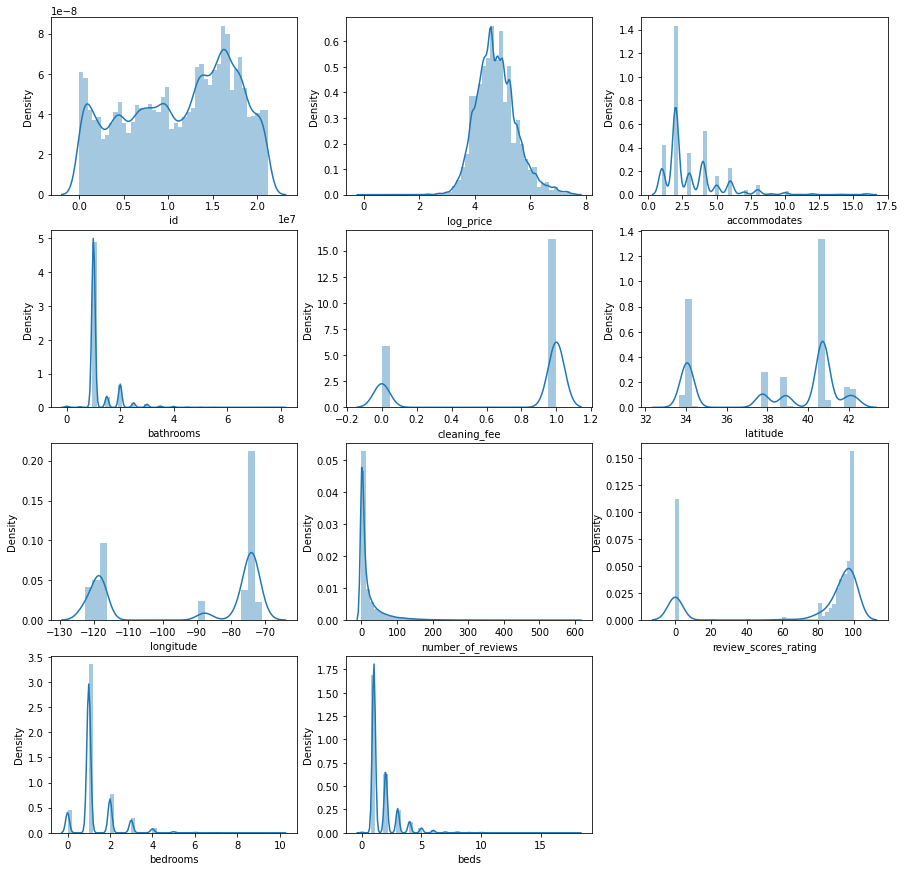

In [42]:
j=1 
fig = plt.figure(figsize = (15,15))
for i in Numerical.columns:
    plt.subplot(4,3,j)
    sns.distplot(Numerical[i])
    j=j+1

1. We need to know how the data are distributed to determine the most appropriate statistical analyses to use.
2. Plotted the histogram with KDE curve to know about the distributions in the data

## Scatterplots from the data with respect to price

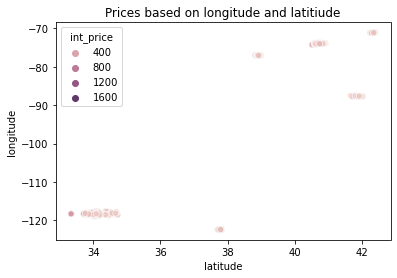

In [43]:
sns.scatterplot(x = "latitude",
                y = "longitude",
                hue = "int_price",
                data = df).set(title = "Prices based on longitude and latitiude"); 

1. Scatter plots are used to plot data points on a horizontal and a vertical axis in the attempt to show how much one variable is affected by another.
2. This Scatterplot shows Prices based on latitude and longitudes.

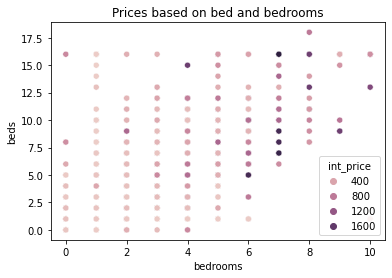

In [44]:
sns.scatterplot(x = "bedrooms",
                y = "beds",
                hue = "int_price",
                data = df).set(title = "Prices based on bed and bedrooms"); 

1. Scatter plots are used to plot data points on a horizontal and a vertical axis in the attempt to show how much one variable is affected by another.
2. This Scatterplot shows Prices based on bed and bedrooms.

## Countplot of various variables from dataset

<AxesSubplot:xlabel='city', ylabel='count'>

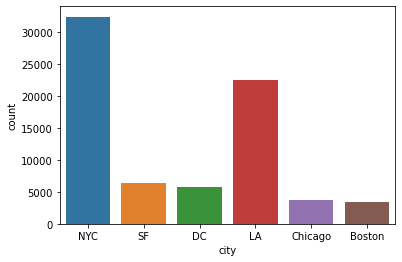

In [45]:
sns.countplot( x="city", data=df)

Observations:

This countplot shows maximum number of Airbnbs are in NYC and then in LA.

<AxesSubplot:xlabel='bed_type', ylabel='count'>

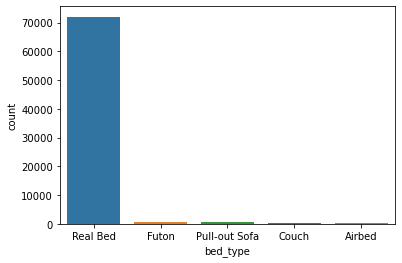

In [46]:
sns.countplot( x="bed_type", data=df)

Observation:
1. This countplot shows that maximum number of AirBnbs have read bed.

<AxesSubplot:xlabel='room_type', ylabel='count'>

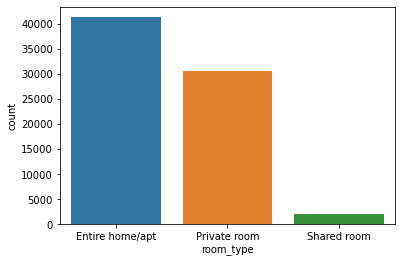

In [47]:
sns.countplot( x="room_type", data=df)

Observations:
1. There are comparatively shared room type rooms than entire home and private rooms.

<AxesSubplot:xlabel='cancellation_policy', ylabel='count'>

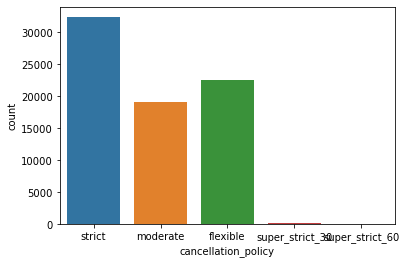

In [48]:
sns.countplot( x="cancellation_policy", data=df)

Observations:
1. Most Airbnb have cancellation policies that are strict, then there is good number of airbnbs which have flexible or moderate.

## Bar graphs of various variables from dataset with respect to Price

In [49]:
def feature_name(fname):  
 sns.barplot(y=fname, x="int_price", data=df)

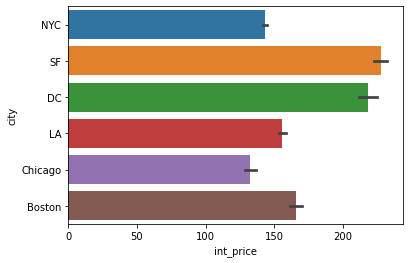

In [50]:
feature_name("city")

Observations:
1. Used bar graph to compare the prices in different cities as it clearly shows and articulate this information in the best way.
2. It can be seen that San Francisco have the highest prices, then comes the DC, Boston, LA, Newyork and Chicago, in the same order.
3. Chicago have the least prices.

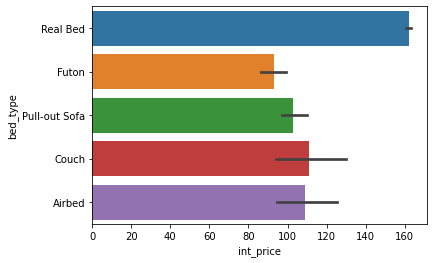

In [51]:
feature_name("bed_type")

Observations:
1. Airbnbs with real bed have the highest prices.
2. Airbnbs with futon have least prices.

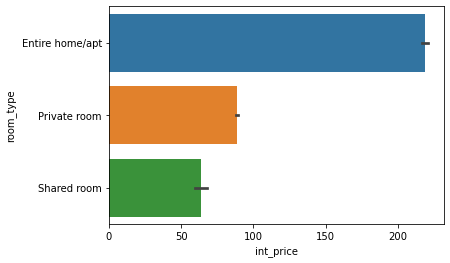

In [52]:
feature_name("room_type")

<AxesSubplot:xlabel='bedrooms', ylabel='int_price'>

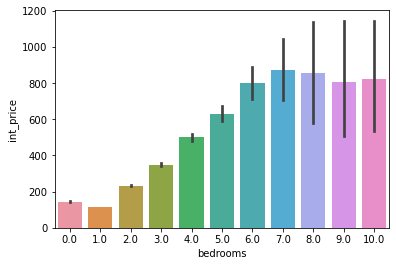

In [53]:
#feature_name("bedrooms")  
sns.barplot(y="int_price", x="bedrooms", data=df)

Observations:
1. Prices increase as number of bedrooms increases in a airbnb.
2. Airbnbs with 6 or more than 6 beds ranges in almost similar prices.

## Mean prices with respect to city and room type

<AxesSubplot:xlabel='room_type', ylabel='city'>

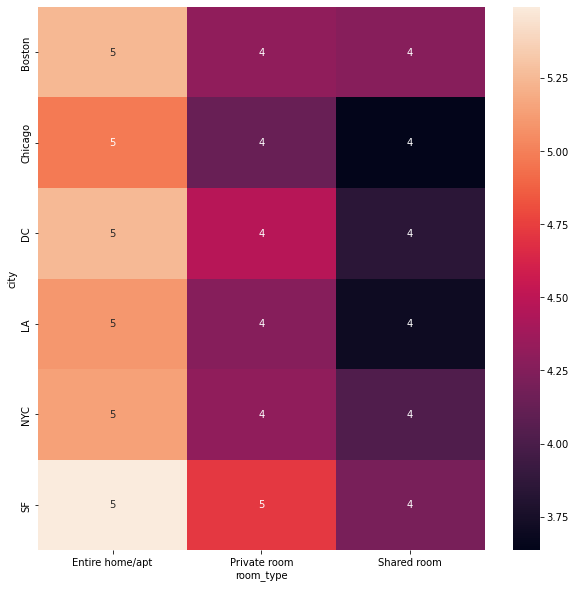

In [54]:
plt.figure(figsize=(10,10))
sns.heatmap(df.groupby([
        'city', 'room_type']).log_price.mean().unstack(),annot=True, fmt=".0f")

Observations:
    
1. Heatmap is used here as the primary purpose of Heat Maps is to better visualize the volume of locations/events within a dataset and assist in directing viewers towards areas on data visualizations that matter most.
2. Prices are similar in all cities of different room types except in SF, there private room prices are higher than other cities.

### One of the most important things determining the price will be "Location" - thus we will add some additional features regarding the locations.

In [55]:
## Mean prices with respect to property type and bedrooms

<AxesSubplot:xlabel='bedrooms', ylabel='property_type'>

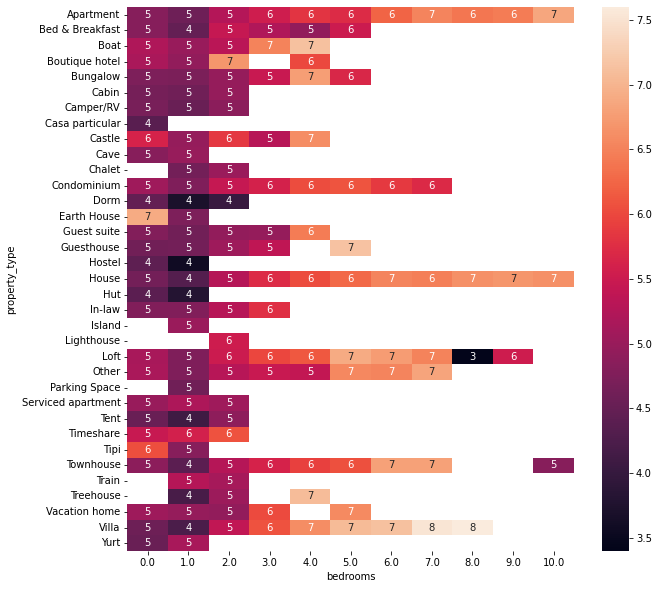

In [56]:
plt.figure(figsize=(10,10))
sns.heatmap(df.groupby(['property_type', 'bedrooms']).log_price.mean().unstack(), annot=True, fmt=".0f")

Observations:
1. Starting pricing ranges from 5 to 7 of any property type with 1 bedroom, then they increases wiht increase in the number of bedrooms in the property.
2. Townhouse is an exception, as you can see one can get a townhouse with 10 bedrooms in 5 where as with 7 bedrooms its price is higher.
3. Loft with 8 bedrooms have less pricing at 3 and with 9 bedrooms at 6.


### Including a map view to and sample 1000 listings from data

In [57]:
import folium

MAPdata = df.copy()
MAPdata = MAPdata.sample(1000) #nlargest(100, 'log_price')
MAPdataloc = MAPdata[['latitude','longitude']]
MAPdatalist = MAPdataloc.values.tolist()

MAPdatat = test_df.copy()
MAPdatat = MAPdatat.sample(1000)
MAPdataloct = MAPdatat[['latitude','longitude']]
MAPdatalistt = MAPdataloct.values.tolist()



mapall = folium.Map(location=[42.3601, -71.0589], zoom_start=12)

for point in range(0, len(MAPdatalist)):
    folium.Marker(MAPdatalist[point], icon=folium.Icon(color='red', icon='cloud')).add_to(mapall)
for point in range(0, len(MAPdatalistt)):
    folium.Marker(MAPdatalistt[point], icon=folium.Icon(color='blue', icon='cloud')).add_to(mapall)    
    
mapall

Its good to see that the location spread between listings in the Train set and Test set seem to be similar!

I know that the seasonality changes the price. For example, the demand increases in Boston for the Boston Marathon and thus, I would generally increase the price to match the demand.

I found example graphs showing the expected occupancy each month in different cities. Being plot.ly graphs, I was able to download the data and manipualte it with Excel to come up with average ocucpancy percentage per month per city.

NY SF, and LA: https://blog.beyondpricing.com/11-toughest-cities-to-book-an-airbnb/ Chicago: https://plot.ly/create/?fid=beyondpricing:1728 Boston: https://plot.ly/~beyondpricing/862.embed DC: https://plot.ly/~beyondpricing/720.embed

In [58]:
def jan_occupancy(row):
    if (row['city']=='Boston'):
        return 0.425806452
    elif (row['city']=='NYC'):
        return 0.490322581
    elif (row['city']=='LA'):
        return 0.591290323
    elif (row['city']=='SF'):
        return 0.591612903
    elif (row['city']=='Chicago'):
        return 0.38
    elif (row['city']=='DC'):
        return 0.47233871
    
def feb_occupancy(row):
    if (row['city']=='Boston'):
        return 0.436785714
    elif (row['city']=='NYC'):
        return 0.5125
    elif (row['city']=='LA'):
        return 0.623214286
    elif (row['city']=='SF'):
        return 0.655
    elif (row['city']=='Chicago'):
        return 0.373928571
    elif (row['city']=='DC'):
        return 0.514375

def mar_occupancy(row):
    if (row['city']=='Boston'):
        return 0.513225806
    elif (row['city']=='NYC'):
        return 0.606129032
    elif (row['city']=='LA'):
        return 0.642580645
    elif (row['city']=='SF'):
        return 0.690967742
    elif (row['city']=='Chicago'):
        return 0.471935484
    elif (row['city']=='DC'):
        return 0.654919355

def apr_occupancy(row):
    if (row['city']=='Boston'):
        return 0.661333333
    elif (row['city']=='NYC'):
        return 0.737333333
    elif (row['city']=='LA'):
        return 0.635333333
    elif (row['city']=='SF'):
        return 0.724333333
    elif (row['city']=='Chicago'):
        return 0.579333333
    elif (row['city']=='DC'):
        return 0.6975

def may_occupancy(row):
    if (row['city']=='Boston'):
        return 0.692258065
    elif (row['city']=='NYC'):
        return 0.785483871
    elif (row['city']=='LA'):
        return 0.618387097
    elif (row['city']=='SF'):
        return 0.789677419
    elif (row['city']=='Chicago'):
        return 0.714516129
    elif (row['city']=='DC'):
        return 0.716612903

def jun_occupancy(row):
    if (row['city']=='Boston'):
        return 0.688333333
    elif (row['city']=='NYC'):
        return 0.747
    elif (row['city']=='LA'):
        return 0.684666667
    elif (row['city']=='SF'):
        return 0.841666667
    elif (row['city']=='Chicago'):
        return 0.708333333
    elif (row['city']=='DC'):
        return 0.736

def jul_occupancy(row):
    if (row['city']=='Boston'):
        return 0.738064516
    elif (row['city']=='NYC'):
        return 0.675806452
    elif (row['city']=='LA'):
        return 0.715483871
    elif (row['city']=='SF'):
        return 0.85483871
    elif (row['city']=='Chicago'):
        return 0.733548387
    elif (row['city']=='DC'):
        return 0.736370968

def aug_occupancy(row):
    if (row['city']=='Boston'):
        return 0.739677419
    elif (row['city']=='NYC'):
        return 0.700322581
    elif (row['city']=='LA'):
        return 0.72516129
    elif (row['city']=='SF'):
        return 0.884516129
    elif (row['city']=='Chicago'):
        return 0.683225806
    elif (row['city']=='DC'):
        return 0.580887097

def sep_occupancy(row):
    if (row['city']=='Boston'):
        return 0.728666667
    elif (row['city']=='NYC'):
        return 0.774
    elif (row['city']=='LA'):
        return 0.574333333
    elif (row['city']=='SF'):
        return 0.843
    elif (row['city']=='Chicago'):
        return 0.702
    elif (row['city']=='DC'):
        return 0.5295
    
def oct_occupancy(row):
    if (row['city']=='Boston'):
        return 0.691290323
    elif (row['city']=='NYC'):
        return 0.758064516
    elif (row['city']=='LA'):
        return 0.579677419
    elif (row['city']=='SF'):
        return 0.797096774
    elif (row['city']=='Chicago'):
        return 0.677419355
    elif (row['city']=='DC'):
        return 0.505322581

def nov_occupancy(row):
    if (row['city']=='Boston'):
        return 0.592333333
    elif (row['city']=='NYC'):
        return 0.634666667
    elif (row['city']=='LA'):
        return 0.559666667
    elif (row['city']=='SF'):
        return 0.644
    elif (row['city']=='Chicago'):
        return 0.543
    elif (row['city']=='DC'):
        return 0.62875

def dec_occupancy(row):
    if (row['city']=='Boston'):
        return 0.44
    elif (row['city']=='NYC'):
        return 0.611290323
    elif (row['city']=='LA'):
        return 0.532580645
    elif (row['city']=='SF'):
        return 0.633870968
    elif (row['city']=='Chicago'):
        return 0.476451613
    elif (row['city']=='DC'):
        return 0.508870968
    
data_train = df   
data_train['jan_occupancy']=data_train.apply(lambda row: jan_occupancy(row), axis=1)
data_train['feb_occupancy']=data_train.apply(lambda row: feb_occupancy(row), axis=1)
data_train['mar_occupancy']=data_train.apply(lambda row: mar_occupancy(row), axis=1)
data_train['apr_occupancy']=data_train.apply(lambda row: apr_occupancy(row), axis=1)
data_train['may_occupancy']=data_train.apply(lambda row: may_occupancy(row), axis=1)
data_train['jun_occupancy']=data_train.apply(lambda row: jun_occupancy(row), axis=1)
data_train['jul_occupancy']=data_train.apply(lambda row: jul_occupancy(row), axis=1)
data_train['aug_occupancy']=data_train.apply(lambda row: aug_occupancy(row), axis=1)
data_train['sep_occupancy']=data_train.apply(lambda row: sep_occupancy(row), axis=1)
data_train['oct_occupancy']=data_train.apply(lambda row: oct_occupancy(row), axis=1)
data_train['nov_occupancy']=data_train.apply(lambda row: nov_occupancy(row), axis=1)
data_train['dec_occupancy']=data_train.apply(lambda row: dec_occupancy(row), axis=1)

In [59]:
data_train.head()

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,mar_occupancy,apr_occupancy,may_occupancy,jun_occupancy,jul_occupancy,aug_occupancy,sep_occupancy,oct_occupancy,nov_occupancy,dec_occupancy
0,6901257,5.010635,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1.0,Real Bed,strict,True,...,0.606129,0.737333,0.785484,0.747000,0.675806,0.700323,0.7740,0.758065,0.634667,0.611290
1,6304928,5.129899,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1.0,Real Bed,strict,True,...,0.606129,0.737333,0.785484,0.747000,0.675806,0.700323,0.7740,0.758065,0.634667,0.611290
2,7919400,4.976734,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1.0,Real Bed,moderate,True,...,0.606129,0.737333,0.785484,0.747000,0.675806,0.700323,0.7740,0.758065,0.634667,0.611290
3,13418779,6.620073,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,flexible,True,...,0.690968,0.724333,0.789677,0.841667,0.854839,0.884516,0.8430,0.797097,0.644000,0.633871
4,3808709,4.744932,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1.0,Real Bed,moderate,True,...,0.654919,0.697500,0.716613,0.736000,0.736371,0.580887,0.5295,0.505323,0.628750,0.508871


### SentimentIntensityAnalyzer to get the "positivity" of each listing

Having an impactful Name and Description for an AirBnb listing- should have an impact! For this, I will import the nltk's SentimentIntensityAnalyzer to get the "positivity" of each listing

### Model building

In [267]:
X = pca_fit
y = df['log_price']

In [64]:
from sklearn.model_selection import KFold
from sklearn.linear_model import LinearRegression
kfold = KFold(n_splits=10,random_state=56,shuffle=True)
average = 0
average1 = 0
for train_idx, test_idx in kfold.split(X,y):    
    X_train, X_CV = X[train_idx], X[test_idx]
    y_train, y_CV = y[train_idx], y[test_idx]
    
    lr = LinearRegression()
    lr.fit(X_train, y_train)
        
    from sklearn.metrics import mean_squared_error    
    pred_CV = lr.predict(X_CV)
    MSE = mean_squared_error(y_CV, pred_CV)
    average = average + MSE

    score = lr.score(X_CV, y_CV)
    average1 = average1 + score
    
    print('R square score = ',score)
    print('MSE = ',MSE)

MSE_AVG = average/10
Rscore_AVG = average1/10
print('*---------------------------*')
print('Average Rscore = ', Rscore_AVG)
print('Average MSE = ',MSE_AVG)

R square score =  0.5654012746245739
MSE =  0.2219231894427874
R square score =  0.5633148730897315
MSE =  0.22458644011037984
R square score =  -8.458262448303454e+16
MSE =  4.248154431217609e+16
R square score =  0.5453933377616086
MSE =  0.22975172494531748
R square score =  0.5734704726216232
MSE =  0.21939141230162745
R square score =  0.5574799143786744
MSE =  0.22532555641800234
R square score =  -3.0569440044212004e+18
MSE =  1.5864460264689231e+18
R square score =  0.569079575816317
MSE =  0.22838161056909412
R square score =  0.567513298882114
MSE =  0.2226512524696817
R square score =  0.5611742773055772
MSE =  0.23098567196795186
*---------------------------*
Average Rscore =  -3.141526628904235e+17
Average MSE =  1.6289275707810992e+17


In [65]:
from sklearn.linear_model import Ridge

kfold = KFold(n_splits=10,random_state=56,shuffle=True)
average = 0
average1 = 0

for train_idx, test_idx in kfold.split(X,y):    
    
    X_train, X_CV = X[train_idx], X[test_idx]
    y_train, y_CV = y[train_idx], y[test_idx]
    
    ridge = Ridge()
    ridge.fit(X_train, y_train)
    
    pred_CV = ridge.predict(X_CV)
    MSE = mean_squared_error(y_CV, pred_CV)
    average = average + MSE
    
    score = ridge.score(X_CV, y_CV)
    average1 = average1 + score
    
    print('R square score = ',score)
    print('MSE = ',MSE)

MSE_AVG = average/10
Rscore_AVG = average1/10
print('*---------------------------*')
print('Average Rscore = ', Rscore_AVG)
print('Average MSE = ', MSE_AVG)

R square score =  0.5654560665468352
MSE =  0.22189521053389064
R square score =  0.5633846563828384
MSE =  0.22455055067789798
R square score =  0.5602826721635872
MSE =  0.22084761807149897
R square score =  0.5454209231397408
MSE =  0.2297377836885441
R square score =  0.5735818788292764
MSE =  0.21933410896465466
R square score =  0.5575218206199788
MSE =  0.2253042182969856
R square score =  0.5811691171337385
MSE =  0.2173584432441897
R square score =  0.5690972644447891
MSE =  0.22837223585108937
R square score =  0.5675170062627048
MSE =  0.22264934384930152
R square score =  0.561272329964992
MSE =  0.23093405977146506
*---------------------------*
Average Rscore =  0.5644703735488481
Average MSE =  0.22409835729495176


In [67]:
from sklearn.linear_model import Lasso
kfold = KFold(n_splits=10,random_state=56,shuffle=True)
average = 0
average1 = 0

for train_idx, test_idx in kfold.split(X,y):    
    
    X_train, X_CV = X[train_idx], X[test_idx]
    y_train, y_CV = y[train_idx], y[test_idx]
    
    lasso = Lasso(0.0001)
    lasso.fit(X_train, y_train)
        
    pred_CV = lasso.predict(X_CV)
    MSE = mean_squared_error(y_CV, pred_CV)
    average = average + MSE
    
    score = lasso.score(X_CV, y_CV)
    average1 = average1 + score
    
    print('R square score = ',score)
    print('MSE = ',MSE)

MSE_AVG = average/10
Rscore_AVG = average1/10
print('*---------------------------*')
print('Average Rscore = ', Rscore_AVG)
print('Average MSE = ', MSE_AVG)

R square score =  0.5654415756275892
MSE =  0.22190261016676868
R square score =  0.5629981681267103
MSE =  0.22474932095020478
R square score =  0.5600607762377265
MSE =  0.2209590650934465
R square score =  0.5447123738571391
MSE =  0.23009587439290147
R square score =  0.5731701348429818
MSE =  0.2195458952276482
R square score =  0.5577467483071019
MSE =  0.22518968800129593
R square score =  0.580446387429283
MSE =  0.21773351444804112
R square score =  0.5688152471056505
MSE =  0.22852170097389693
R square score =  0.5670218191034142
MSE =  0.222904274326789
R square score =  0.56111105352176
MSE =  0.23101895121170196
*---------------------------*
Average Rscore =  0.5641524284159357
Average MSE =  0.22426208947926946


In [69]:
from sklearn.model_selection import GridSearchCV

parameters = {"alpha":np.logspace(-2,2,50)}
lasso_grid = GridSearchCV(lasso, parameters, cv=10) 
lasso_grid.fit(X,y)

print('Hyper Parameters for Lasso:\n',lasso_grid.best_params_)
print('Score for Hyper Parameters from Grid Search:',lasso_grid.best_score_)
lasso_grid.cv_results_

Hyper Parameters for Lasso:
 {'alpha': 0.01}
Score for Hyper Parameters from Grid Search: 0.528949056502577


{'mean_fit_time': array([0.24253354, 0.22141299, 0.21514075, 0.21628282, 0.21951413,
        0.21352246, 0.21372917, 0.21584039, 0.2132899 , 0.21622748,
        0.21550622, 0.21219695, 0.21059933, 0.21075897, 0.21303992,
        0.21325176, 0.20989184, 0.21018224, 0.21749454, 0.21481354,
        0.21125567, 0.22817662, 0.22080555, 0.22792993, 0.22047772,
        0.21880774, 0.21943886, 0.22626674, 0.21965792, 0.21657646,
        0.22607675, 0.21591234, 0.21459224, 0.22255845, 0.21630249,
        0.21614668, 0.21530213, 0.21526484, 0.21471605, 0.2158181 ,
        0.21510143, 0.21460836, 0.21571763, 0.21619928, 0.216903  ,
        0.23223929, 0.21973236, 0.21400917, 0.21623869, 0.21671212]),
 'std_fit_time': array([0.02715979, 0.00300113, 0.00254939, 0.00366443, 0.0106573 ,
        0.00342235, 0.00308756, 0.00190802, 0.00346448, 0.00260731,
        0.00611061, 0.00353208, 0.00416541, 0.00537463, 0.00248085,
        0.00249487, 0.00383793, 0.00496913, 0.00884345, 0.00718183,
        0.003

In [268]:
pca0 = PCA()
pca0.fit(r_train_df)
X_train = pca0.transform(r_train_df)
y_train = df['log_price']

X_test = pca0.transform(r_test_df)

In [72]:
lasso = Lasso(0.0001)
lasso.fit(X_train, y_train)

# Prices predicted for test dataset is given by 'price_predicted'
price_predicted = lasso.predict(X_test)

In [73]:
print(price_predicted)

[4.12293926 4.97952909 4.4763032  ... 4.73559085 5.16852667 4.30827414]


In [74]:
preds = pd.DataFrame(price_predicted, columns=['log_price'])
preds

,log_price
0,4.122939
1,4.979529
2,4.476303
3,4.566898
4,5.096422
...,...
25453,5.850378
25454,4.516045
25455,4.735591
25456,5.168527


In [95]:
import numpy as np
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.001, random_state = 891990)
#y_train = y_train.reshape(-1, 1)
#y_test = y_test.reshape(-1, 1)
# Feature Scaling
#sc_X = StandardScaler()
#X_train = sc_X.fit_transform(X_train)
#X_test = sc_X.transform(X_test)

In [96]:
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
import xgboost as xgb
import lightgbm as lgb

ModuleNotFoundError: No module named 'lightgbm'

In [241]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [242]:
pred_1=lr.predict(X_test)

In [243]:
from sklearn.metrics import r2_score
score_1=r2_score(y_test,pred_1)


In [244]:
score_1

0.8234865819363038

In [139]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

In [140]:
rgb=GradientBoostingRegressor()
param_grid={'n_estimators':[100,500], 
            'learning_rate': [0.1,0.05,0.02],
            'max_depth':[4], 
            'min_samples_leaf':[3], 
            'max_features':[1.0] }
    

In [147]:
y=train_df['log_price']

In [148]:
train_df=train_df.drop(['log_price'],axis=1)

In [ ]:
#drop unnecessary features from both train and test set


train_df=train_df.drop(['first_review','host_response_rate','review_scores_rating','neighbourhood','last_review','thumbnail_url','zipcode'],axis=1)

In [176]:
train_df=train_df.drop(['city','description'],axis=1)

In [177]:
df_test=df_test.drop(['city','description'],axis=1)

In [170]:
#let separate the catrgorical features for encoding process
list_cate=[]
for i in list(train_df.columns):
    if train_df[i].dtype=='object':
        list_cate.append(i)
   

In [179]:
test_cate=[]
df_test = test_df
for i in list(df_test.columns):
    if df_test[i].dtype=='object':
        test_cate.append(i)
    

In [180]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [181]:
for i in list_cate:
    
    train_df[i]=le.fit_transform(train_df[i])

In [182]:
for i in test_cate:
    df_test[i]=le.fit_transform(df_test[i])


TypeError: Encoders require their input to be uniformly strings or numbers. Got ['int', 'str']

In [188]:
train_df['cleaning_fee']=le.fit_transform(train_df['cleaning_fee'])
df_test['cleaning_fee']=le.fit_transform(df_test['cleaning_fee'])

In [189]:
train_df

,id,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,host_has_profile_pic,...,mar_occupancy,apr_occupancy,may_occupancy,jun_occupancy,jul_occupancy,aug_occupancy,sep_occupancy,oct_occupancy,nov_occupancy,dec_occupancy
0,6901257,0,0,6142,3,1.0,4,2,1,1,...,0.606129,0.737333,0.785484,0.747000,0.675806,0.700323,0.774000,0.758065,0.634667,0.611290
1,6304928,0,0,6269,7,1.0,4,2,1,1,...,0.606129,0.737333,0.785484,0.747000,0.675806,0.700323,0.774000,0.758065,0.634667,0.611290
2,7919400,0,0,21345,5,1.0,4,1,1,1,...,0.606129,0.737333,0.785484,0.747000,0.675806,0.700323,0.774000,0.758065,0.634667,0.611290
3,13418779,17,0,38854,4,1.0,4,0,1,1,...,0.690968,0.724333,0.789677,0.841667,0.854839,0.884516,0.843000,0.797097,0.644000,0.633871
4,3808709,0,0,55413,2,1.0,4,1,1,1,...,0.654919,0.697500,0.716613,0.736000,0.736371,0.580887,0.529500,0.505323,0.628750,0.508871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74106,14549287,0,1,67121,1,1.0,4,0,0,1,...,0.606129,0.737333,0.785484,0.747000,0.675806,0.700323,0.774000,0.758065,0.634667,0.611290
74107,13281809,0,0,38652,4,2.0,4,1,1,1,...,0.642581,0.635333,0.618387,0.684667,0.715484,0.725161,0.574333,0.579677,0.559667,0.532581
74108,18688039,0,0,61276,5,1.0,4,1,1,1,...,0.606129,0.737333,0.785484,0.747000,0.675806,0.700323,0.774000,0.758065,0.634667,0.611290
74109,17045948,0,0,48796,2,1.0,4,2,1,1,...,0.606129,0.737333,0.785484,0.747000,0.675806,0.700323,0.774000,0.758065,0.634667,0.611290


In [190]:
test_df

,id,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,...,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,thumbnail_url,zipcode,bedrooms,beds
0,3895911,0,1,14286,2,1.0,4,0,1,3,...,34.028372,-118.494449,19806,421,6,97.0,14770,90403,1.0,1.0
1,9710289,0,0,7621,3,1.0,4,2,1,4,...,40.720380,-73.942329,4868,538,2,80.0,20094,11222,1.0,1.0
2,9051635,0,1,3410,1,1.0,4,2,1,5,...,37.785434,-122.470284,18388,402,2,100.0,782,94118,1.0,1.0
3,708374,0,0,13185,1,1.0,4,3,1,3,...,33.976026,-118.463471,14568,296,7,94.0,4962,90292,0.0,1.0
4,626296,0,0,19509,2,1.0,4,0,1,4,...,40.735573,-74.005996,4662,526,0,0.0,14967,10014,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25453,13098256,16,0,23071,6,2.0,4,3,1,5,...,37.739624,-122.414839,22096,46,8,90.0,2198,94110,3.0,4.0
25454,13550830,0,1,4599,1,2.5,4,0,0,3,...,34.148955,-118.368865,14058,477,0,0.0,0,91602,1.0,1.0
25455,13899483,16,0,15015,2,1.0,4,2,1,3,...,34.086756,-118.353835,24208,516,11,95.0,2088,90046,1.0,1.0
25456,9939029,0,0,22188,4,1.0,4,2,1,4,...,40.760537,-73.989708,12725,217,0,0.0,21619,10036,1.0,3.0


In [197]:
x=train_df
y=df['log_price']

In [198]:
clf=GridSearchCV(rgb,param_grid,cv=5,verbose=0)

In [199]:
import numpy as np
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x,y, test_size = 0.001, random_state = 891990)
#y_train = y_train.reshape(-1, 1)

In [203]:
clf.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=GradientBoostingRegressor(max_depth=4, max_features=1.0,
                                                 n_estimators=500),
             param_grid={'learning_rate': [0.1, 0.05, 0.02], 'max_depth': [4],
                         'max_features': [1.0], 'min_samples_leaf': [3],
                         'n_estimators': [100, 500]})

In [201]:
rgb=GradientBoostingRegressor(learning_rate=0.1,max_depth=4,max_features=1.0,n_estimators=500)

In [205]:
rgb.fit(X_train,y_train)
pred_2=rgb.predict(X_test)

In [206]:
score_2=r2_score(y_test,pred_2)

In [207]:
score_2

0.9999993914836371

In [210]:
submission=pd.DataFrame({'predictions':pred_2})

In [211]:
submission

,predictions
0,4.595128
1,5.991538
2,3.871476
3,4.553876
4,5.164820
...,...
70,4.941775
71,4.381994
72,4.905290
73,4.382018


In [216]:
import lightgbm as lgb

gbm = lgb.LGBMRegressor(num_leaves=200, learning_rate=0.009105, n_estimators=3000, verbose=1, max_depth=-1)
#gbm = lgb.LGBMRegressor(num_leaves=190, learning_rate=0.0109, n_estimators=4000, verbose=1, max_depth=-1)

gbm.fit(X_train, y_train)
y_pred = gbm.predict(X_test)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2232
[LightGBM] [Info] Number of data points in the train set: 74036, number of used features: 32
[LightGBM] [Info] Start training from score 4.782049


In [101]:
pip install lightgbm

Note: you may need to restart the kernel to use updated packages.


In [218]:
y_gbm = pd.DataFrame(y_pred)
submission = pd.concat([df['id'], y_gbm], axis=1)
submission.columns = ['id', 'log_price']
submission.to_csv('RudyCelekli_knn_lgb18.csv', sep=',', index=False)

In [224]:
from xgboost import XGBRegressor
xgb = XGBRegressor(learning_rate=0.04, max_depth=10, min_child_weight=2, n_estimators=1500, seed=25)
xgb.fit(X_train, y_train)
y_pred2 = xgb.predict(X_test)

In [236]:
score_2=r2_score(y_test,y_pred2)

In [237]:
score_2

0.9999996692292434

In [226]:
y_xgb = pd.DataFrame(y_pred2)
submission = pd.concat([df['id'], y_xgb], axis=1)
submission.columns = ['id', 'log_price']
submission.to_csv('RudyCelekli_jnn_k18.csv', sep=',', index=False)

In [ ]:
y_predANN = classifier.predict(Xtest2)
y_ann = pd.DataFrame(y_predANN)
submission = pd.concat([data_test['id'], y_ann], axis=1)
submission.columns = ['id', 'log_price']
submission.to_csv('RudyCelekli_submission_ANNadam_kn23.csv', sep=',', index=False)

In [235]:
from sklearn import svm, tree, linear_model, neighbors, naive_bayes, ensemble, discriminant_analysis, gaussian_process

bag = ensemble.BaggingRegressor(n_estimators=100)
bag.fit(X_train, y_train)
y_pred4 = bag.predict(X_test)
y_bag = pd.DataFrame(y_pred4)
submission = pd.concat([df['id'], y_bag], axis=1)
submission.columns = ['id', 'log_price']
submission.to_csv('RudyCelekli_submission_bag_kn018.csv', sep=',', index=False)

In [240]:
score_3=r2_score(y_test,y_pred4)
score_3

0.9999999500499116

In [277]:
data = {'Model': ['LinearRegression','lightgbm','XGBRegressor', 'BaggingRegressor','Ridge','Lasso'],
        'accuracy': [score_1, 0.4782049, '0.99999966', '0.99999995','0.56447037','0.56415242']}
accuracy = pd.DataFrame(data)
    
accuracy 

,Model,accuracy
0,LinearRegression,0.823487
1,lightgbm,0.478205
2,XGBRegressor,0.99999966
3,BaggingRegressor,0.99999995
4,Ridge,0.56447037
5,Lasso,0.56415242


In [278]:
data = {'Model': ['LinearRegression','lightgbm','XGBRegressor', 'BaggingRegressor','Ridge','Lasso'],
        'accuracy': [score_1, 0.4782049, 0.99999966, 0.99999995,0.56447037,0.56415242]}
accuracy = pd.DataFrame(data)

### Visualising and comparing the model accuracies

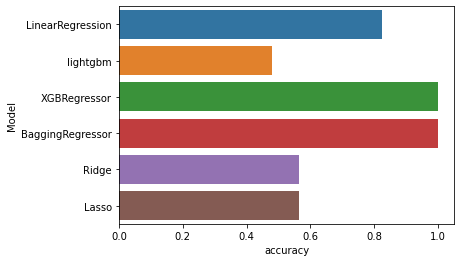

In [279]:
results =  sns.barplot(y="Model", x="accuracy", data=accuracy)

Observations:

1. XGBRegressor and ensemblee bagging seemed to have 99% accurate predictions, which can cause overfitting of the data.
2. Lightgbm have score of 47% which is quite low and that means it was not able to pick up information from the features accurately.
3. Lasso and ridge have almost same 56% accuracy scores.
4. Linear regression seems to have fitted the data better than other 3 models with a score of 82%.

## Dataset Summary

1. Log prices of airbnbs have mean of 4.7 with standard deviation of 0.717.
2. bedroom of airbnbs have mean of 1.2 with standard deviation of 0.85.
3. Mean number revies that a airbnb gets is 20.9 with standard deviation of 37.8.
4. No of ratings that a airbnb gets is 94 with standard deviation of 7.8.
5. There are lots of missing values in the dataset.
6. 5 features have categorical datatypes while remaing 10 are numerical/ordinal.
7. Number of classes in city = 6,Number of classes in property_type = 35,Number of classes in room_type = 3,Number of classes in bed_type = 5,Number of classes in cancellation_policy = 5,Number of classes in host_response_rate = 80
8. maximum number of Airbnbs are in NYC and then in LA.
9. maximum number of AirBnbs have read bed.
10. There are comparatively shared room type rooms than entire home and private rooms.
11. Airbnbs with real bed have the highest prices.
12. Airbnbs with futon have least prices.
13. It can be seen that San Francisco have the highest prices, then comes the DC, Boston, LA, Newyork and Chicago, in the same order.
14. Chicago have the least prices.
15. Prices increase as number of bedrooms increases in a airbnb.
16. Airbnbs with 6 or more than 6 beds ranges in almost similar prices.
17. XGBRegressor and ensemblee bagging seemed to have 99% accurate predictions, which can cause overfitting of the data.
18. Lightgbm have score of 47% which is quite low and that means it was not able to pick up information from the features accurately.
19. Lasso and ridge have almost same 56% accuracy scores.
20. Linear regression seems to have fitted the data better than other 3 models with a score of 82%.